# Term Project - Sample

![](banner_project.jpg)

In [1]:
cat("Open code cell here for notebook apparatus.")

options(warn=-1)

# Load some required functions
library(ggplot2, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(caret,   verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(mclust,    verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)

# Define some useful functions
size = function(data) data.frame(observations=dim(data)[1], variables=dim(data)[2])
                                 
# Set some visualization constants
restore = list(repr.plot.width=8, repr.plot.height=2)
PALETTE = c("#00A9FF", "#F8766D", "#7CAE00", "#C77CFF", "#CD9600", "#00BE67", "#FF61CC", "#00BFC4")
theme.no_legend = theme(legend.position="none")
theme.no_x_axis_labels = theme(axis.text.x=element_blank(), axis.ticks.x=element_blank())

# Set some visualization formatting defaults
options(scipen=10)                         
options(repr.matrix.max.cols=1000)
options(repr.matrix.max.rows=1000)
options(restore)
update_geom_defaults("point", list(size=0.25, colour=PALETTE[1]))
update_geom_defaults("line", list(size=0.15))
update_geom_defaults("col", list(colour=NA, fill=PALETTE[1]))
theme_update(plot.title=element_text(size=10, hjust=0.5), plot.subtitle=element_text(size=8, face="italic", hjust=0.5), axis.title=element_text(size=7), axis.text=element_text(size=7), strip.text=element_text(size=7), strip.text.y=element_text(angle=90), legend.title=element_blank(), legend.text=element_text(size=7))

Open code cell here for notebook apparatus.

Package 'mclust' version 5.4.3
Type 'citation("mclust")' for citing this R package in publications.


## Analyst

* Florence Nightingale

## Business Parameters

In [2]:
budget = 1000000

## Discussion

Describe the approach to model construction, evaluation, and how the model predictions inform the decision about how to invest. (250 to 1000+ words)

In this sample ...

Data is prepared by adding a variable populated by a 3-class cluster model, built using Gaussian mixture model estimation by expectation-maximization.  Then, a linear regression model is built to predict growth given cluster assignment and prices for all 4 quarters.  Then, investment is equally distributed among companies predicted to grow more than 10%. 

## Data

### Data Dictionary

In [3]:
dictionary = read.csv("Data Dictionary.csv")
size(dictionary)
dictionary

observations,variables
674,4


ï..Variable.Name,Data.Type,Variable.Description,Help
ACCHGQ,NUM,ACCHGQ -- Accounting Changes - Cumulative Effect,NA
ACCHGY,NUM,ACCHGY -- Accounting Changes - Cumulative Effect,NA
ACCTCHGQ,CHAR,ACCTCHGQ -- Adoption of Accounting Changes,NA
ACCTSTDQ,CHAR,ACCTSTDQ -- Accounting Standard,NA
ACOMINCQ,NUM,ACOMINCQ -- Accumulated Other Comprehensive Income (Loss),NA
ACOQ,NUM,ACOQ -- Current Assets - Other - Total,NA
ACTQ,NUM,ACTQ -- Current Assets - Total,NA
ADD1,CHAR,ADD1 -- Address Line 1,NA
ADD2,CHAR,ADD2 -- Address Line 2,NA
ADD3,CHAR,ADD3 -- Address Line 3,NA


### Data for 2016, Quarters 1, 2, 3, 4

In [4]:
data.2016.q1 = read.csv("Company Fundamentals 2016-Q1 A.csv", header=TRUE)
data.2016.q2 = read.csv("Company Fundamentals 2016-Q2 A.csv", header=TRUE)
data.2016.q3 = read.csv("Company Fundamentals 2016-Q3 A.csv", header=TRUE)
data.2016.q4 = read.csv("Company Fundamentals 2016-Q4 A.csv", header=TRUE)

In [5]:
m12 = merge(data.2016.q1, data.2016.q2, by=c("gvkey", "tic", "conm"), suffixes=c(".q1",".q2"))
m34 = merge(data.2016.q3, data.2016.q4, by=c("gvkey", "tic", "conm"), suffixes=c(".q3",".q4"))
m1234 = merge(m12, m34, by=c("gvkey", "tic", "conm"))
data.2016 = m1234[order(m1234$tic),]
size(data.2016)
head(data.2016)

observations,variables
3000,2711


gvkey  tic   conm                        datadate.q1 fyearq.q1 fqtr.q1
2484  62527 3AMFC AMB FINANCIAL CORP          20160331    2016      1      
2715  65924 3CSBB CSB BANCORP INC/OH          20160331    2016      1      
1449  21521 3CZFS CITIZENS FINANCIAL SVCS INC 20160331    2016      1      
255  119436 3FBPI FIRST BANCORP INDIANA INC   20160331    2016      3      
2410  61225 3FETM FENTURA FINANCIAL INC       20160331    2016      1      
1105  18301 3FKYS FIRST KEYSTONE CORP         20160331    2016      1      
     fyr.q1 indfmt.q1 consol.q1 popsrc.q1 datafmt.q1 cusip.q1  acctchgq.q1
2484 12     INDL      C         D         STD        001984103 NA         
2715 12     INDL      C         D         STD        12628R107 NA         
1449 12     INDL      C         D         STD        174615104 NA         
255   6     INDL      C         D         STD        31867T202 NA         
2410 12     INDL      C         D         STD        314645102 NA         
1105 12     INDL      C         D         STD        320654205 NA         
     acctstdq.q1 adrrq.q1 ajexq.q1 ajpq.q1 bsprq.q1 compstq.q1 curcdq.q1
2484 DS          NA       1.0000   1.0000  GB       NA         USD      
2715 DS          NA       1.0000   1.0000  GB       NA         USD      
1449 DS          NA       1.0605   1.0605  GB       NA         USD      
255  DS          NA       1.0000   1.0000  GB       NA         USD      
2410 DS          NA       1.0000   1.0000  GB       AC         USD      
1105 DS          NA       1.0000   1.0000  GB       NA         USD      
     curncdq.q1 currtrq.q1 curuscnq.q1 datacqtr.q1 datafqtr.q1 finalq.q1
2484 USD        1          NA          2016Q1      2016Q1      Y        
2715 USD        1          NA          2016Q1      2016Q1      Y        
1449 USD        1          NA          2016Q1      2016Q1      Y        
255  USD        1          NA          2016Q1      2016Q3      Y        
2410 USD        1          NA          2016Q1      2016Q1      Y        
1105 USD        1          NA          2016Q1      2016Q1      Y        
     ogmq.q1 rp.q1 scfq.q1 srcq.q1 staltq.q1 updq.q1 apdedateq.q1 fdateq.q1
2484 NA      Q      7       3      NA        3       20160331     20160622 
2715 NA      Q      7       5      NA        3       20160331     20160603 
1449 NA      Q      7       5      NA        3       20160331     20160523 
255  NA      Q     NA       3      NA        3       20160331     20160712 
2410 NA      Q     NA      20      NA        3       20160331     20170117 
1105 NA      Q      7       5      NA        3       20160331     20160524 
     pdateq.q1 rdq.q1   acchgq.q1 acomincq.q1 acoq.q1 actq.q1 altoq.q1 ancq.q1
2484       NA  20160430 NA        0.021       NA      NA      NA       NA     
2715 20160421  20160419 NA        0.147       NA      NA      NA       NA     
1449 20160428  20160427 NA        0.903       NA      NA      NA       NA     
255        NA  20160427 NA           NA       NA      NA      NA       NA     
2410       NA  20160429 NA           NA       NA      NA      NA       NA     
1105 20160430  20160429 NA        6.197       NA      NA      NA       NA     
     anoq.q1 aociderglq.q1 aociotherq.q1 aocipenq.q1 aocisecglq.q1 aol2q.q1
2484 NA       0             0             0.0         0                 NA 
2715  0       0             0             0.0         0            121.175 
1449  0       0             0            -2.4         0            364.502 
255  NA      NA            NA              NA        NA                 NA 
2410 NA      NA            NA              NA        NA                 NA 
1105  0       0             0             0.0         0            379.426 
     aoq.q1  apq.q1   aqaq.q1 aqdq.q1 aqepsq.q1 aqpl1q.q1 aqpq.q1 arcedq.q1
2484  13.874  167.104 NA      NA      NA           NA     NA      NA       
2715 173.223  509.980 NA      NA      NA        1.067     NA      NA       
1449 435.084 1017.811 NA      NA      NA        7.423     NA      NA       
255  

### Data for 2017, Quarter 2

In [6]:
data.2017.q2 = read.csv("Company Price 2017-Q2 A.csv", header=TRUE)
size(data.2017.q2)
head(data.2017.q2)

observations,variables
3000,4


gvkey,tic,conm,prccq
1004,AIR,AAR CORP,34.94
1045,AAL,AMERICAN AIRLINES GROUP INC,50.32
1050,CECE,CECO ENVIRONMENTAL CORP,9.18
1062,ASA,ASA GOLD AND PRECIOUS METALS,11.88
1072,AVX,AVX CORP,16.34
1075,PNW,PINNACLE WEST CAPITAL CORP,85.16


In [7]:
data.2017 = data.2017.q2[order(data.2017.q2$tic), ]
data.2017$growth = data.2017$prccq / data.2016$prccq.q4
size(data.2017)
head(data.2017)

observations,variables
3000,5


,gvkey,tic,conm,prccq,growth
2183,62527,3AMFC,AMB FINANCIAL CORP,17.00,1.1333333
2384,65924,3CSBB,CSB BANCORP INC/OH,30.60,0.9870968
1455,21521,3CZFS,CITIZENS FINANCIAL SVCS INC,53.99,1.0186792
2625,119436,3FBPI,FIRST BANCORP INDIANA INC,20.80,1.1028632
2116,61225,3FETM,FENTURA FINANCIAL INC,18.25,1.1406250
1139,18301,3FKYS,FIRST KEYSTONE CORP,27.00,1.0975610


### All Data

In [8]:
data = cbind(data.2016, data.2017[, "growth", drop=FALSE])
size(data)
head(data)

observations,variables
3000,2712


gvkey  tic   conm                        datadate.q1 fyearq.q1 fqtr.q1
2484  62527 3AMFC AMB FINANCIAL CORP          20160331    2016      1      
2715  65924 3CSBB CSB BANCORP INC/OH          20160331    2016      1      
1449  21521 3CZFS CITIZENS FINANCIAL SVCS INC 20160331    2016      1      
255  119436 3FBPI FIRST BANCORP INDIANA INC   20160331    2016      3      
2410  61225 3FETM FENTURA FINANCIAL INC       20160331    2016      1      
1105  18301 3FKYS FIRST KEYSTONE CORP         20160331    2016      1      
     fyr.q1 indfmt.q1 consol.q1 popsrc.q1 datafmt.q1 cusip.q1  acctchgq.q1
2484 12     INDL      C         D         STD        001984103 NA         
2715 12     INDL      C         D         STD        12628R107 NA         
1449 12     INDL      C         D         STD        174615104 NA         
255   6     INDL      C         D         STD        31867T202 NA         
2410 12     INDL      C         D         STD        314645102 NA         
1105 12     INDL      C         D         STD        320654205 NA         
     acctstdq.q1 adrrq.q1 ajexq.q1 ajpq.q1 bsprq.q1 compstq.q1 curcdq.q1
2484 DS          NA       1.0000   1.0000  GB       NA         USD      
2715 DS          NA       1.0000   1.0000  GB       NA         USD      
1449 DS          NA       1.0605   1.0605  GB       NA         USD      
255  DS          NA       1.0000   1.0000  GB       NA         USD      
2410 DS          NA       1.0000   1.0000  GB       AC         USD      
1105 DS          NA       1.0000   1.0000  GB       NA         USD      
     curncdq.q1 currtrq.q1 curuscnq.q1 datacqtr.q1 datafqtr.q1 finalq.q1
2484 USD        1          NA          2016Q1      2016Q1      Y        
2715 USD        1          NA          2016Q1      2016Q1      Y        
1449 USD        1          NA          2016Q1      2016Q1      Y        
255  USD        1          NA          2016Q1      2016Q3      Y        
2410 USD        1          NA          2016Q1      2016Q1      Y        
1105 USD        1          NA          2016Q1      2016Q1      Y        
     ogmq.q1 rp.q1 scfq.q1 srcq.q1 staltq.q1 updq.q1 apdedateq.q1 fdateq.q1
2484 NA      Q      7       3      NA        3       20160331     20160622 
2715 NA      Q      7       5      NA        3       20160331     20160603 
1449 NA      Q      7       5      NA        3       20160331     20160523 
255  NA      Q     NA       3      NA        3       20160331     20160712 
2410 NA      Q     NA      20      NA        3       20160331     20170117 
1105 NA      Q      7       5      NA        3       20160331     20160524 
     pdateq.q1 rdq.q1   acchgq.q1 acomincq.q1 acoq.q1 actq.q1 altoq.q1 ancq.q1
2484       NA  20160430 NA        0.021       NA      NA      NA       NA     
2715 20160421  20160419 NA        0.147       NA      NA      NA       NA     
1449 20160428  20160427 NA        0.903       NA      NA      NA       NA     
255        NA  20160427 NA           NA       NA      NA      NA       NA     
2410       NA  20160429 NA           NA       NA      NA      NA       NA     
1105 20160430  20160429 NA        6.197       NA      NA      NA       NA     
     anoq.q1 aociderglq.q1 aociotherq.q1 aocipenq.q1 aocisecglq.q1 aol2q.q1
2484 NA       0             0             0.0         0                 NA 
2715  0       0             0             0.0         0            121.175 
1449  0       0             0            -2.4         0            364.502 
255  NA      NA            NA              NA        NA                 NA 
2410 NA      NA            NA              NA        NA                 NA 
1105  0       0             0             0.0         0            379.426 
     aoq.q1  apq.q1   aqaq.q1 aqdq.q1 aqepsq.q1 aqpl1q.q1 aqpq.q1 arcedq.q1
2484  13.874  167.104 NA      NA      NA           NA     NA      NA       
2715 173.223  509.980 NA      NA      NA        1.067     NA      NA       
1449 435.084 1017.811 NA      NA      NA        7.423     NA      NA       
255  

## Data Exploration

### Preliminary Exploration

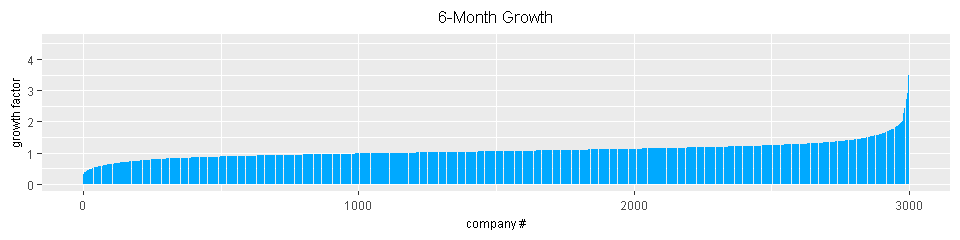

In [9]:
data.ok = data[order(data$growth),]

ggplot(data.ok) + ggtitle("6-Month Growth") + xlab("company #") + ylab("growth factor") +
geom_col(aes(x=1:nrow(data.ok), y=growth))

### More Exploration

## Cluster Model

In [10]:
set.seed(12345)
cluster = factor(Mclust(data[, c("prchq.q4","prclq.q4")], G=3)$classification)
as.data.frame(table(cluster))

cluster,Freq
1,1783
2,1141
3,76


In [11]:
data$cluster = cluster

### More Cluster Modeling

Develop and evaluate additional models.  Select the best best model.

## Predictive Model

### Build Model

In [12]:
model = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data)
model


Call:
lm(formula = growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + 
    cluster, data = data)

Coefficients:
(Intercept)     prccq.q1     prccq.q2     prccq.q3     prccq.q4     cluster2  
  1.0715427   -0.0002449   -0.0001257    0.0011435   -0.0006987   -0.0105866  
   cluster3  
  0.0002951  


### Insample Performance Measures

In [13]:
growth.predicted = predict(model, newdata=data, type="response")

#### Model Performance Measures

In [14]:
insample_rmse = sqrt(mean((growth.predicted - data$growth)^2))
insample_mape = mean(abs(growth.predicted - data$growth) / data$growth)
data.frame(insample_rmse, insample_mape)

insample_rmse,insample_mape
0.278014,0.1816944


#### Business Performance Measure

In [15]:
recommend = data[, "tic", drop=FALSE]
recommend$invest = 0
recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))

insample_bpm = sum(recommend$invest * data$growth) - budget
data.frame(insample_bpm)

insample_bpm
135773.7


### Cross-Validation Performance Measures

#### Model Performance Measures

In [16]:
nfold = 10

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold = createFolds(data$growth, k=nfold)
data.train = list()
data.test  = list()
for (i in 1:nfold) { data.train[[i]] = data[setdiff(1:nrow(data), fold[[i]]),]
                     data.test[[i]]  = data[fold[[i]],] }

# Model Performance Measures for Each Fold
rmse = list()
mape = list()
for (i in 1:nfold) { model.i = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data.train[[i]])
                     growth.predicted = predict(model.i, newdata=data.test[[i]], type="response")
                    
                     rmse[[i]] = sqrt(mean((growth.predicted - data.test[[i]]$growth)^2))
                     mape[[i]] = mean(abs(growth.predicted - data$growth) / data$growth) }

# Model Performance Measures for the Model
cv_rmse = mean(as.numeric(rmse))
cv_mape = mean(as.numeric(mape))
data.frame(nfold, cv_rmse, cv_mape)

nfold,cv_rmse,cv_mape
10,0.2792749,0.1832743


#### Business Performance Measure

In [17]:
nfold = 10

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold = createFolds(data$growth, k=nfold)
data.train = list()
data.test  = list()
for (i in 1:nfold) { data.train[[i]] = data[setdiff(1:nrow(data), fold[[i]]),]
                     data.test[[i]]  = data[fold[[i]],] }

# A Business Peformance Measure for Each Fold
bpm = list()
for (i in 1:nfold) { model.i = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data.train[[i]])
                     growth.predicted = predict(model.i, newdata=data.test[[i]], type="response")

                     recommend = data.test[[i]][, "tic", drop=FALSE]
                     recommend$invest = 0
                     recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))

                     bpm[[i]] = sum(recommend$invest * data.test[[i]]$growth) - budget }

# A Business Performance Measure for the Model
cv_bpm = mean(as.numeric(bpm))
data.frame(nfold, cv_bpm)
data.frame(fold=1:nfold, bpm=unlist(bpm))

nfold,cv_bpm
10,125393.9


fold,bpm
1,67896.87
2,36806.43
3,70521.85
4,106300.95
5,155950.75
6,189651.53
7,157641.26
8,284671.96
9,173179.53
10,11317.88


### More Predictive Modeling

Develop and evaluate additional models.  Select the best best model.

## Decision

### New Data, Quarters 1, 2, 3, 4

In [18]:
data.new.q1 = read.csv("Company Fundamentals 2016-Q1 B.csv", header=TRUE)
data.new.q2 = read.csv("Company Fundamentals 2016-Q2 B.csv", header=TRUE)
data.new.q3 = read.csv("Company Fundamentals 2016-Q3 B.csv", header=TRUE)
data.new.q4 = read.csv("Company Fundamentals 2016-Q4 B.csv", header=TRUE)

In [19]:
m12 = merge(data.new.q1, data.new.q2, by=c("gvkey", "tic", "conm"), suffixes=c(".q1",".q2"))
m34 = merge(data.new.q3, data.new.q4, by=c("gvkey", "tic", "conm"), suffixes=c(".q3",".q4"))
m1234 = merge(m12, m34, by=c("gvkey", "tic", "conm"))

data.new = m1234[order(m1234$tic),]
size(data.new)
head(data.new)

observations,variables
1000,2711


gvkey  tic   conm                        datadate.q1 fyearq.q1 fqtr.q1
929  62527 3AMFC AMB FINANCIAL CORP          20160331    2016      1      
32  119617 7687B APOLLO MEDICAL HLDG INC-OLD 20160331    2015      4      
399 185549 AAT   AMERICAN ASSETS TRUST INC   20160331    2016      1      
803  27265 AAV   ADVANTAGE OIL & GAS LTD     20160331    2016      1      
318 184527 ABAC  RENMIN TIANLI GROUP INC     20160331    2016      1      
642 210418 ABB   ABB LTD                     20160331    2016      1      
    fyr.q1 indfmt.q1 consol.q1 popsrc.q1 datafmt.q1 cusip.q1  acctchgq.q1
929 12     INDL      C         D         STD        001984103 NA         
32   3     INDL      C         D         STD        03799N934 NA         
399 12     INDL      C         D         STD        024013104 NA         
803 12     INDL      C         D         STD        00765F101 NA         
318 12     INDL      C         D         STD        G7500A100 NA         
642 12     INDL      C         D         STD        000375204 NA         
    acctstdq.q1 adrrq.q1 ajexq.q1 ajpq.q1 bsprq.q1 compstq.q1 curcdq.q1
929 DS          NA       1.00     1.00    GB       NA         USD      
32  DS          NA       1.00     1.00    NA       NA         USD      
399 DS          NA       1.00     1.00    GB       NA         USD      
803 DI          NA       1.00     1.00    NA       NA         CAD      
318 DU          NA       0.25     0.25    NA       NA         USD      
642 DU           1       1.00     1.00    NA       NA         USD      
    curncdq.q1 currtrq.q1 curuscnq.q1 datacqtr.q1 datafqtr.q1 finalq.q1 ogmq.q1
929 USD        1              NA      2016Q1      2016Q1      Y         NA     
32  USD        1              NA      2016Q1      2015Q4      Y         NA     
399 USD        1              NA      2016Q1      2016Q1      Y         NA     
803 CAD        1          0.7711      2016Q1      2016Q1      Y         G      
318 USD        1              NA      2016Q1      2016Q1      Y         NA     
642 USD        1              NA      2016Q1      2016Q1      Y         NA     
    rp.q1 scfq.q1 srcq.q1 staltq.q1 updq.q1 apdedateq.q1 fdateq.q1 pdateq.q1
929 Q     7        3      NA        3       20160331     20160622        NA 
32  Q     7        5      NA        3       20160331     20160706        NA 
399 Q     7        5      NA        3       20160331     20160511  20160426 
803 Q     7       53      NA        3       20160331     20160510  20160510 
318 Q     7        5      NA        3       20160331     20160603  20160522 
642 Q     7        5      NA        3       20160331     20160422        NA 
    rdq.q1   acchgq.q1 acomincq.q1 acoq.q1  actq.q1   altoq.q1 ancq.q1  
929 20160430 NA            0.021         NA        NA       NA        NA
32  20160629  0            0.000      0.294    13.558    0.785     6.009
399 20160426  0           -3.143      0.000        NA   24.794        NA
803 20160505  0            0.000     57.490    67.747    7.568  1486.393
318 20160511  0           -0.411     12.793    74.187    3.053    30.446
642 20160420  0        -4518.000   1787.000 23083.000 1279.000 18731.000
    anoq.q1 aociderglq.q1 aociotherq.q1 aocipenq.q1 aocisecglq.q1 aol2q.q1
929 NA       0.000        0                 0       0               NA    
32   0       0.000        0                 0       0                0    
399  0      -3.143        0                 0       0                0    
803 NA       0.000        0                 0       0               NA    
318 NA       0.000        0                 0       0               NA    
642  0      -6.000        0             -1736       0             1792    
    aoq.q1    apq.q1   aqaq.q1 aqdq.q1 aqepsq.q1 aqpl1q.q1 aqpq.q1 arcedq.q1
929    13.874  167.104 NA      NA      NA         NA       NA      NA       
32      4.761    2.037 NA      NA      NA          0       NA      NA       
399  1878.305   37.014 NA      NA      NA          0       NA      NA       
803     7.568 

### Use Models to Make Predictions & Inform Recommendation

In [20]:
set.seed(12345)
data.new$cluster = factor(Mclust(data.new[, c("prchq.q4","prclq.q4")], G=3)$classification)

In [21]:
growth.predicted = predict(model, newdata=data.new, type="response")

recommend = data.new[, "tic", drop=FALSE]
recommend$invest = 0
recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))
data.frame(portfolio_size=length(which(recommend$invest>0)))
recommend[recommend$invest>0,]

portfolio_size
10


,tic,invest
771,ALNY,100000
53,ALX,100000
698,CABO,100000
212,CIBY,100000
343,CRDE,100000
24,CSGP,100000
122,ELFIF,100000
217,FBAK,100000
334,FLT,100000
732,GWPH,100000


### Record Recommendation

In [22]:
write.csv(recommend, "Team 1 Recommendation B (sample).csv", row.names=FALSE)

## Reflection

Reflect on what your learned from this project. (250 to 1000+ words)



<font size=1;>
<p style="text-align: left;">
Copyright (c) Berkeley Data Analytics Group, LLC
<span style="float: right;">
document revised May 30, 2019
</span>
</p>
</font>